In [1]:
import os
import skimage.io as io 
import numpy
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, accuracy_score, f1_score
from scipy.special import softmax
from EyeClassifier import openEyeCheck

In [43]:
path = './EyesDataset/test/'
images = os.listdir(path)

In [58]:
y, scores, y_pred, problem, index = [],[],[],[],[]
for j,i in enumerate(images):
    test_img = os.path.join(path,i)
    ii = i.split('.')[0]
    label = int(ii.split('_')[1])
    out = openEyeCheck(test_img)
    y.append(label)
    scores.append(softmax(openEyeCheck(test_img))[0][label])
    y_pred.append(np.argmax(out))
    if np.argmax(openEyeCheck(test_img)) != label:
        problem.append(ii)
        index.append(j)
    print(label, softmax(openEyeCheck(test_img))[0],  softmax(openEyeCheck(test_img))[0][label])
    

0 [1.000000e+00 4.210622e-08] 1.0
0 [9.9994040e-01 5.9834252e-05] 0.9999404
1 [3.8939962e-04 9.9961048e-01] 0.9996105
0 [1.0000000e+00 5.3460423e-09] 1.0
1 [0.00604435 0.9939556 ] 0.9939556
0 [9.9974257e-01 2.5752769e-04] 0.99974257
0 [0.9981528  0.00184716] 0.9981528
1 [0.13840088 0.8615991 ] 0.8615991
0 [0.84254664 0.15745337] 0.84254664
1 [0.03511623 0.96488374] 0.96488374
1 [0.07236794 0.92763203] 0.92763203
0 [9.9993706e-01 6.2938336e-05] 0.99993706
0 [0.99802524 0.0019748 ] 0.99802524
0 [9.9999857e-01 1.4988071e-06] 0.99999857
1 [0.00347206 0.99652797] 0.99652797
0 [1.0000000e+00 1.9214173e-07] 1.0
0 [9.9998999e-01 1.0165281e-05] 0.99999
1 [9.7871663e-05 9.9990225e-01] 0.99990225
1 [4.910057e-04 9.995090e-01] 0.999509
1 [0.45291874 0.54708123] 0.54708123
1 [1.4345061e-06 9.9999857e-01] 0.99999857
1 [3.1271807e-04 9.9968725e-01] 0.99968725
1 [0.9917322  0.00826768] 0.008267682
0 [9.9998474e-01 1.5145099e-05] 0.99998474
0 [9.999194e-01 8.072369e-05] 0.9999194
0 [9.999995e-01 4.4374

In [60]:
index

[22, 31, 73, 121]

In [82]:
scores[31] = 0.49

In [84]:
scores[31]

0.49

In [49]:
len(problem)

4

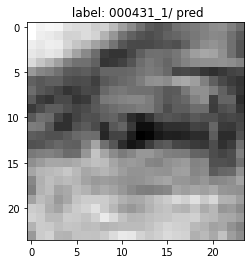

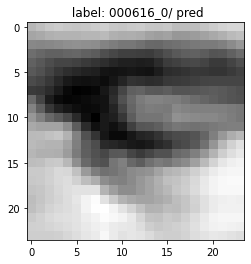

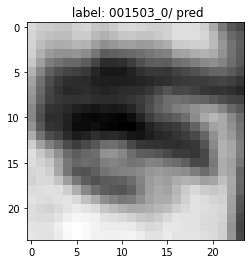

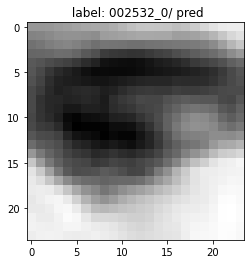

In [11]:
for i in problem:
  plt.imshow(io.imread(os.path.join(path + i + ".jpg")), cmap='gray')
  plt.title(f' label: {i}/ pred')
  plt.show()

In [85]:
f1_score(y, y_pred)

0.9789473684210526

In [95]:
fpr, tpr, threshold = roc_curve(y, y_pred, pos_label=1)
fnr = 1 - tpr
eer_threshold = threshold[np.nanargmin(np.absolute((fnr - fpr)))]
EER = fpr[np.nanargmin(np.absolute((fnr - fpr)))]

auc(fpr, tpr), EER

(0.9805299076676035, 0.02830188679245283)

In [92]:
eer_threshold

1

In [93]:
EER = fpr[np.nanargmin(np.absolute((fnr - fpr)))]
EER

0.02830188679245283

In [94]:
EER = fnr[np.nanargmin(np.absolute((fnr - fpr)))]
EER

0.010638297872340385

0.40651344841429143

In [22]:
path = './EyesDataset/train/'
images = os.listdir(path)

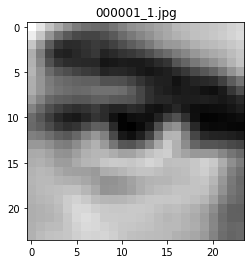

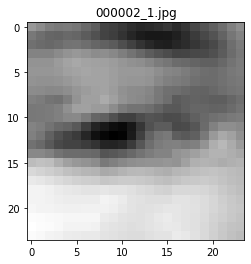

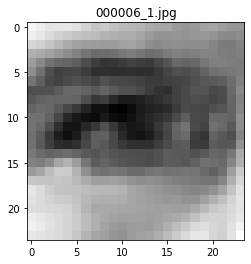

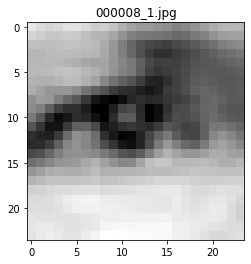

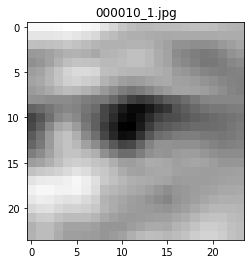

...

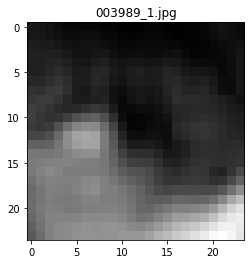

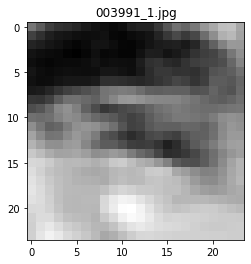

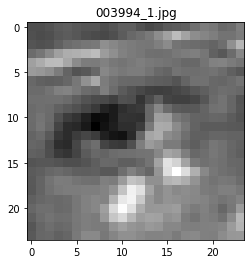

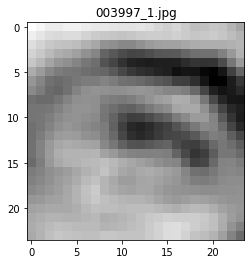

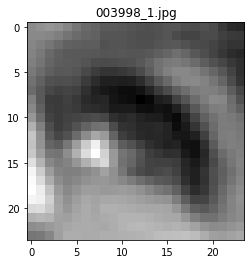

In [69]:
for i in images:
    label = i.split('.')[0]
    label = int(label.split('_')[1])
    if label == 1:
      plt.imshow(io.imread(os.path.join(path + i)), cmap='gray')
      plt.title(i)
      plt.show()